In [39]:
using Pkg;
Pkg.activate(".");
Pkg.resolve(); Pkg.instantiate();
using DataFrames, CSV
using LinearAlgebra
using Plots

  Activating project at `~/Dropbox/ITT2023/Imbuia/codes`


  No Changes to `~/Dropbox/ITT2023/Imbuia/codes/Project.toml`
  No Changes to `~/Dropbox/ITT2023/Imbuia/codes/Manifest.toml`


Precompiling project...


  ✓ PrettyTables


  ✓ DataFrames


  ✓ Latexify → DataFramesExt


  ✓ Plots


  ✓ Plots → UnitfulExt


  5 dependencies successfully precompiled in 142 seconds. 160 already precompiled.
  1 dependency precompiled but a different version is currently loaded. Restart julia to access the new version


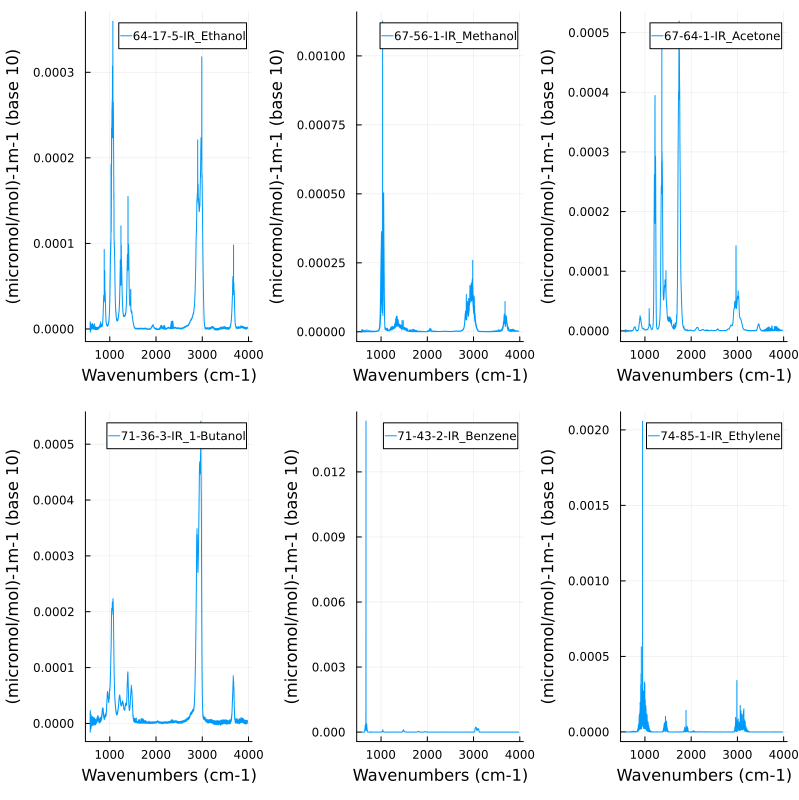

In [77]:
# Load data
nist_data_files = readdir("data/nist_data/")
filter!(data -> occursin(".csv", data), nist_data_files)
# for nist_csv_file in nist_data_files
# end
function plot_nist_data(nist_data_files)
    num_data = length(nist_data_files)
    plt = plot(layout=num_data, size=(800, 800))
    for (index, nist_csv_file) in enumerate(nist_data_files)
        df_nist_data = CSV.read("data/nist_data/" * nist_csv_file, DataFrame)
        nist_data_x = df_nist_data[:, :x]
        nist_data_y = df_nist_data[:, :y]
        plot!(plt, nist_data_x, nist_data_y, label=nist_csv_file[1:end-4], legend=:topright, xlabel="Wavenumbers (cm-1)", ylabel="(micromol/mol)-1m-1 (base 10)", subplot=index)
    end
    return plt
end

plot_nist_data(nist_data_files)


In [35]:
using JuMP, HiGHS



function cs_LP_model(M::AbstractMatrix{T}, y::Vector{T}) where T <: Number
    num_row, num_col = size(M)
    size_y = length(y)
    @assert num_row == size_y

    model = Model(HiGHS.Optimizer)
    
    # Define variables
    @variables(model, begin
        x⁺[1:ncol] >= 0
        x⁻[1:ncol] >= 0
    end)

    # Define objective function
    @objective(model, Min, sum(x⁺) + sum(x⁻))

    # Define constraints

    @constraints(model, begin
        M * x⁺ - M * x⁻ .== y
    end)

    optimize!(model)

    return value.(x⁺) - value.(x⁻)
end